## Lab Assignment

At this stage, we will assume that you are able to use Python, and understand its basic use. 

### Introduction

First we will cover some basics regarding Python and Image Manipulation.

The first step is importing the required packages. In this assignment we will be using [opencv](https://opencv.org/), [MatPlotLib](https://matplotlib.org/) and [Numpy](https://numpy.org/). We have also provided helper functions for displaying the images inline. Check that your environment is configured correctly by running the section below. If this section fails, refer to the README on how to set up the environment.

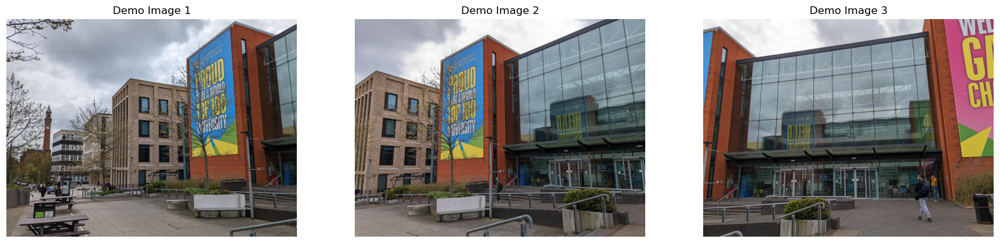

In [5]:
import cv2 as cv
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.pyplot as plt

# Define the list of image paths
images = ['./demo/demo1.jpg', './demo/demo2.jpg', './demo/demo3.jpg']
titles = ['Demo Image 1', 'Demo Image 2', 'Demo Image 3']

# Set up the matplotlib figure and axes, based on the number of images
fig, axes = plt.subplots(1, len(images), figsize=(20, 10))

# Loop through images, read and convert color, and display
for ax, image_path,title in zip(axes, images,titles):
    img = cv.imread(image_path)  # Read image
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)  # Convert from BGR to RGB
    ax.set_title(title) 
    ax.imshow(img_rgb) 
    ax.axis('off')

plt.show()  # Show the plot

# Part1
## Question 1.1 
A panorama is formed by stitching together multiple images into one seamless
image. In this task, you will need to implement Feature Based Panoramic Image Stitching
in Python.
### Question 1.1.1 [10 marks] 
Three images of the Aston Webb building have been provided.
The following steps need to be taken in order to create the panorama:
1. Use any preprocessing you like to manipulate the given images
2. Create and Configure the Stitcher.
3. Stitch Images.
4. Check the Result and Display the Panorama.
5. Save the Panorama:

A detailed guide to this function can be found here:
https://www.opencvhelp.org/tutorials/advanced/panorama-creation/

Your solution to this task should include:
1. Figure showing undistorted input images (report in PDF)
2. Figure showing complete panorama (report in PDF)
3. A written explanation of the steps taken in the report, stating which functions you
used, why you used them and a short explanation of how they work. (report in PDF)
4. Code for Task 1.1.1
5. All images needed for the code to function


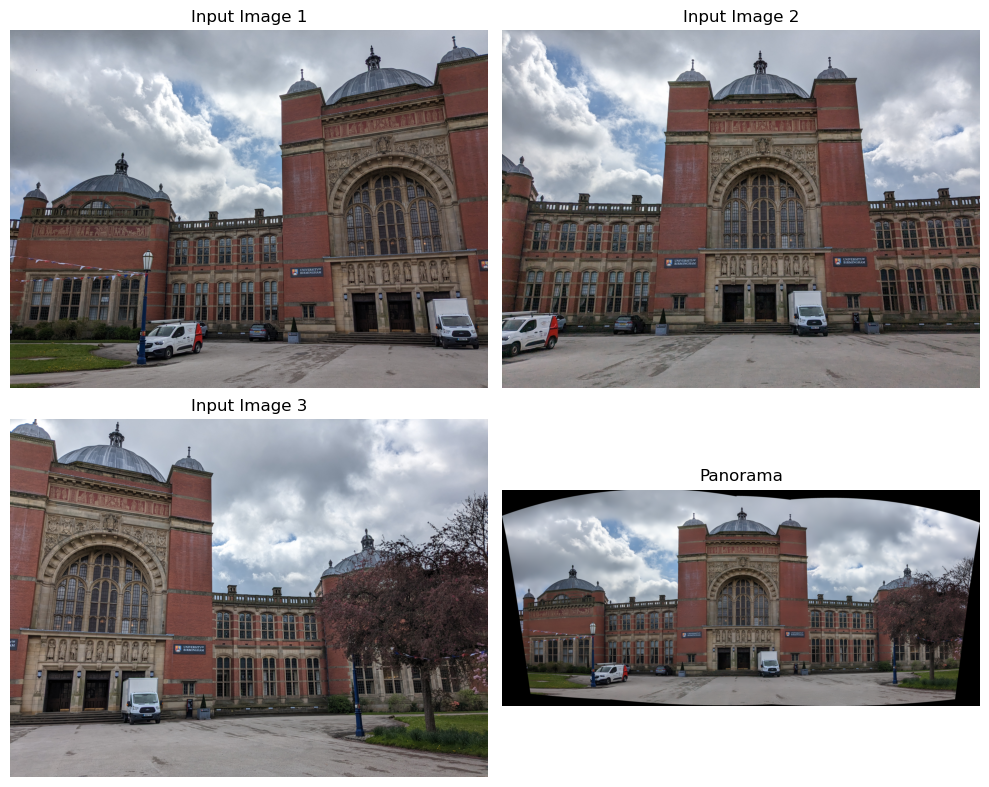

In [1]:
# Load images
img1 = cv.imread('./1_1/1.jpg') 
img2 = cv.imread('./1_1/2.jpg') 
img3 = cv.imread('./1_1/3.jpg')

images = [img1, img2, img3]

# Stitching function
def stitch_images(images):

    # Loading the Stitcher class
    stitcher = cv.Stitcher.create(cv.Stitcher_PANORAMA)

    status, panorama = stitcher.stitch(images)

    if status == cv.Stitcher_OK:
        # Display input images and panorama in a subplot
        fig, axes = plt.subplots(2, 2, figsize=(10, 8))
        
        for i, img in enumerate(images):
            axes[i // 2, i % 2].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
            axes[i // 2, i % 2].set_title(f"Input Image {i+1}")
            axes[i // 2, i % 2].axis('off')
        
        axes[1, 1].imshow(cv.cvtColor(panorama, cv.COLOR_BGR2RGB))
        axes[1, 1].set_title("Panorama")
        axes[1, 1].axis('off')
    
        plt.tight_layout()
        plt.savefig('stitched_images.png')  # Save the plotted images
    
    else:
        print("Error:", status)

    if status == cv.Stitcher_OK: 
        cv.imwrite('panorama.jpg', panorama)
    
    plt.show()  # Display the plot
    return

# Call the stitching function
stitch_images(images)


## Question 1.1.2 [10 marks] 
The panorama which has been produced is not a uniform shape.
Write an algorithm from scratch that iteratively crops the image so that no black areas
are included. Your algorithm should preserve as much of the non-black areas of the
image as possible and work with any provided panorama. See Fig 1 for an example of
the expected result.

Your solution should include:
1. A figure showing the original panorama overlaid with lines representing the cropped
area (report in PDF)
2. The cropped panorama (report in PDF)
3. An explanation of your algorithm (report in PDF)
4. Code for Task 1.1.2
5. All files needed for Task 1.2 to function

A detailed guide to this function can be found here: https://docs.opencv.org/4.x/d4/d18/tutorial_sfm_scene_reconstruction.html

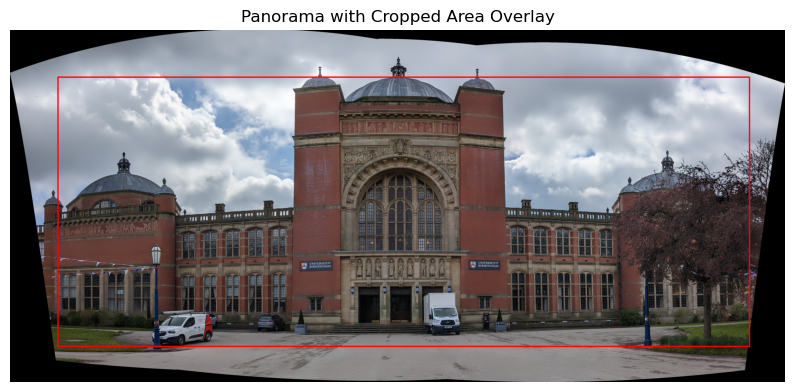

In [38]:
def stitch_images_with_crop(images):
    # Call the Stitcher class
    stitcher = cv.Stitcher.create(cv.Stitcher_PANORAMA)

    # Stitching images
    status, panorama = stitcher.stitch(images)

    # Verifying stitching procedur
    if status == cv.Stitcher_OK:
        
        # Cropping the panorama, thresholding, color conversion
        stitched = cv.copyMakeBorder(panorama, 50, 50, 50, 50, cv.BORDER_CONSTANT, (0, 0, 0)) 
        gray = cv.cvtColor(stitched, cv.COLOR_BGR2GRAY) 
        _, thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY) 

        # Finding contours and cropping
        contours, _ = cv.findContours(thresh.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
        current_max = max(contours, key=cv.contourArea)
        mask = np.zeros(thresh.shape, dtype="uint8")
       
        # Bounding rectangle
        (x, y, w, h) = cv.boundingRect(current_max)
        
        # Draw rectangle on the mask
        cv.rectangle(mask, (x, y), (x + w, y + h), 255, -1) 

        # Dilate the mask to include more surrounding areas
        kernel = np.ones((30,30),np.uint8)
        
        # Mask dilatation
        dilated_mask = cv.dilate(mask, kernel)  
        minRect = dilated_mask.copy() 
        sub = dilated_mask.copy()

        # Threshold for erosion loop until the threshold is under specified number
        while cv.countNonZero(sub) > 400:

            # Erosion of mask
            minRect = cv.erode(minRect, None)

            # substract the mask from threshold if above satisfied
            sub = cv.subtract(minRect, thresh) 

          # Find new contours again
            contours, _ = cv.findContours(minRect.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
            current_max = max(contours, key=cv.contourArea)
            (x, y, w, h) = cv.boundingRect(current_max) 
            cropped_panorama = stitched[y:y + h, x:x + w]  

        # Overlaying lines representing the cropped from the panorama
        panorama_with_lines = panorama.copy() 
        cv.rectangle(panorama_with_lines, (x, y), (x + w, y + h), (0, 0, 255), 10)

        # Plot the overlaying lines
        plt.figure(figsize=(10, 10))
        plt.imshow(cv.cvtColor(panorama_with_lines, cv.COLOR_BGR2RGB))
        plt.title("Panorama with Cropped Area Overlay")
        plt.axis('off')
        plt.savefig('Panorama_with_cropped_area_overlay.png') 

        cv.imwrite('cropped_panorama.jpg', cropped_panorama)
    
    else:  # If stitching fails
        print("Error:", status)  # Print error message

    plt.show()  # Display the plot
    return

# Call the stitching function
stitch_images_with_crop(images)

# Question 1.2 
 
In this task you will be performing image alignment and registration with OpenCV.


## Question 1.2.1 [10 marks] 
 
The following steps need to be taken:
1. Use any pre-processing you like to manipulate the given images
2. Detect SIFT features in both images
3. Detect features using the minimum eigenvalue algorithm
4. Apply RANSC to match keypoints across images
5. Compute the homography matrix etc.
6. Apply a perspective warp to align the images
7. Try 2 more methods to detect and match keypoints: K-Nearest Neighbors Matcher
(KNN),Brute-Force Matcher.
Your solution to this task should include:
1. Figure showing matched features (report in PDF)
2. Figure showing aligned image (report in PDF)
3. A written explanation and images of the steps taken in the report, stating which
functions you used, why you used them and a short explanation of how they work.
(report in PDF)
4. A written explanation of different methods comparison. (report in PDF)
5. Code for Task 1.2 (python file)
6. All images needed for the code to function

# Plot form and photograph

Text(0.5, 1.0, 'Photograph: gray')

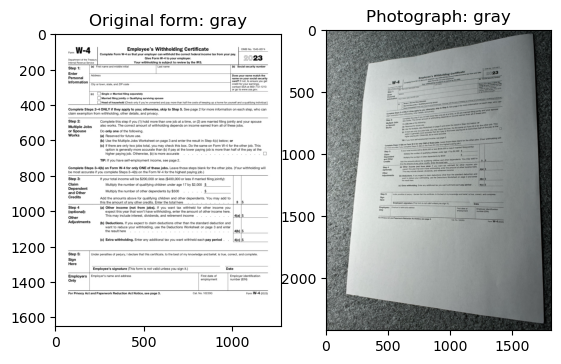

In [40]:
# We will try to align following images:
import cv2 as cv
form = cv.imread('./1_2/1_2_template.jpg')
picture = cv.imread('./1_2/1_2_test.jpg')

plt.figure()
plt.subplot(1,2,1)
plt.imshow(form)
plt.title("Original form: gray")
plt.subplot(1,2,2)
plt.imshow(picture)
plt.title("Photograph: gray")

# ORB and Brute Force

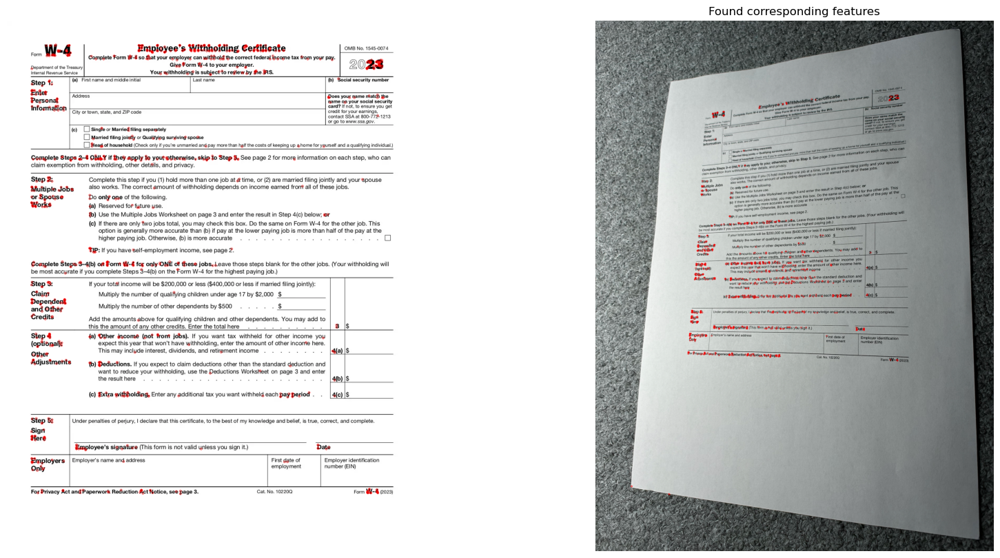

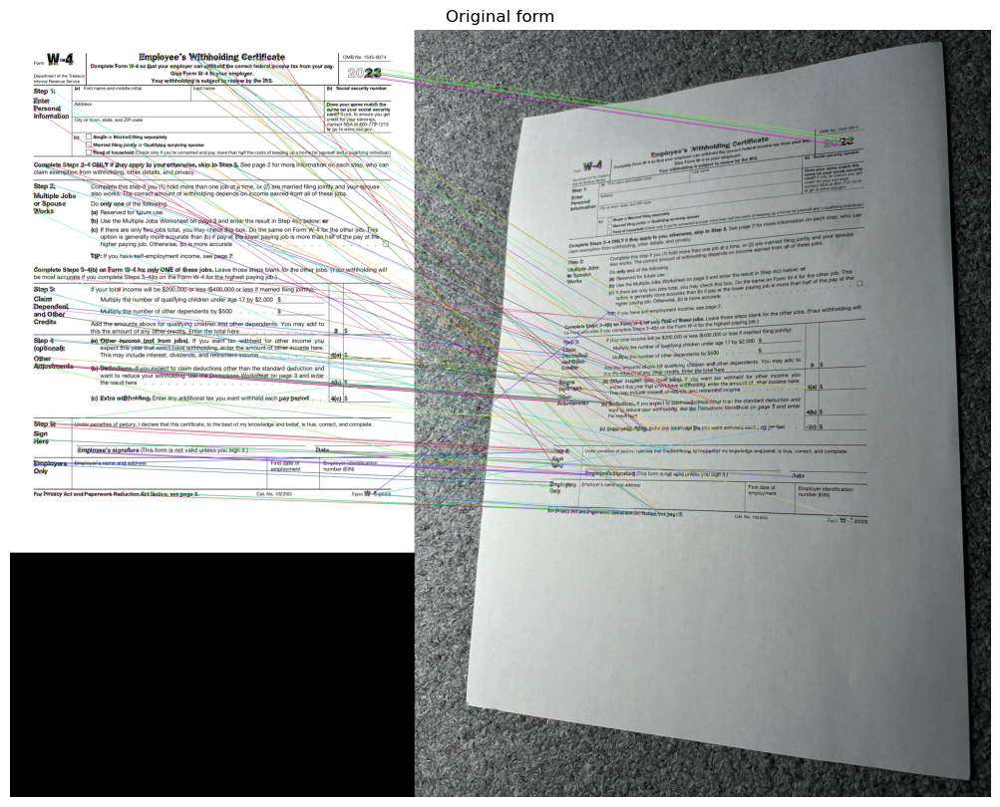

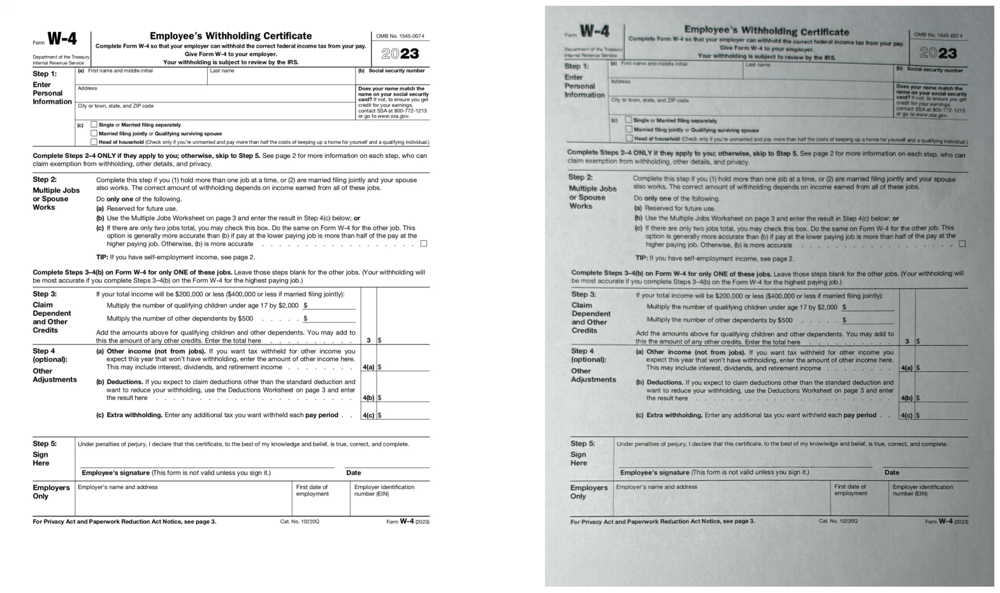

In [41]:
# Create ORB class to find features, define number of features
numFeatures = 1000 
orb = cv.ORB_create(numFeatures) 

# Detect keypoints and compute descriptors for both images
keypoint1, descriptor1 = orb.detectAndCompute(form, None)
keypoint2, descriptor2 = orb.detectAndCompute(picture, None)

# Draw keypoints on both images
formDraw = cv.drawKeypoints(form, keypoint1, outImage=np.array([]), color=(255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DEFAULT)
pictureDraw = cv.drawKeypoints(picture, keypoint2, outImage=np.array([]), color=(255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DEFAULT)

# Plot keypoints
plt.figure(figsize=[25, 10])
plt.subplot(121); plt.axis('off'); plt.imshow(formDraw)
plt.subplot(122); plt.axis('off'); plt.imshow(pictureDraw)
plt.title('The corresponding features')
plt.savefig('ORB-BruteForce.png')

# Create a brute-force matcher
initMatcher = cv.DescriptorMatcher_create(cv.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)

# Match descriptors between the two images
matchedPoints = initMatcher.match(descriptor1, descriptor2, None)
matchedPoints = [match for match in matchedPoints] 
matchedPoints.sort(key=lambda x: x.distance, reverse=False)  

# Select the top 10% of matches with lowest hamming distance
numGreatMatch = int(len(matchedPoints) * 0.1)
matchedPoints = matchedPoints[:numGreatMatch]

# Draw matches and save
img_matches = cv.drawMatches(form, keypoint1, picture, keypoint2, matchedPoints, None)
plt.figure(figsize=(40, 10))
plt.imshow(img_matches)
plt.axis('off')
plt.title('Original form')
plt.savefig('ORB_Matches.png') 

# Compute homography between matched keypoints
points1 = np.zeros((len(matchedPoints), 2), dtype=np.float32)
points2 = np.zeros((len(matchedPoints), 2), dtype=np.float32)

# Extract coordinates of matched keypoints
for i, match in enumerate(matchedPoints):
    points1[i, :] = keypoint1[match.queryIdx].pt
    points2[i, :] = keypoint2[match.trainIdx].pt

# Find homography matrix using RANSAC algorithm
h, mask = cv.findHomography(points2, points1, cv.RANSAC)

# Warp the second image to align with the first image
height, width, channels = form.shape
image2Registration = cv.warpPerspective(picture, h, (width, height))

# Plot original and warped image and save
plt.figure(figsize=(20, 20))
plt.subplot(121); plt.axis('off'); plt.imshow(form)
plt.subplot(122); plt.axis('off'); plt.imshow(image2Registration)
plt.savefig('ORB_WarpedImages.png') 


# SIFT and FLANN matcher

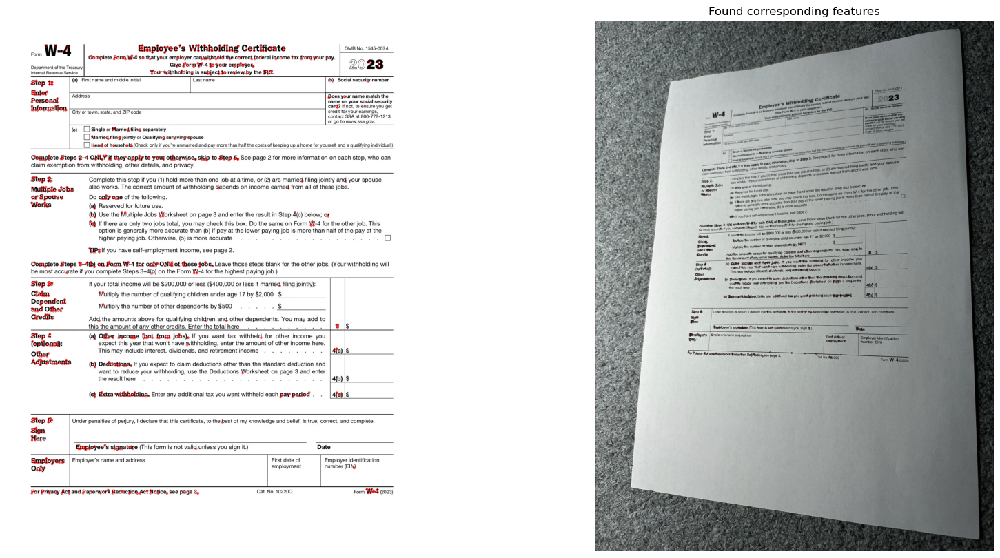

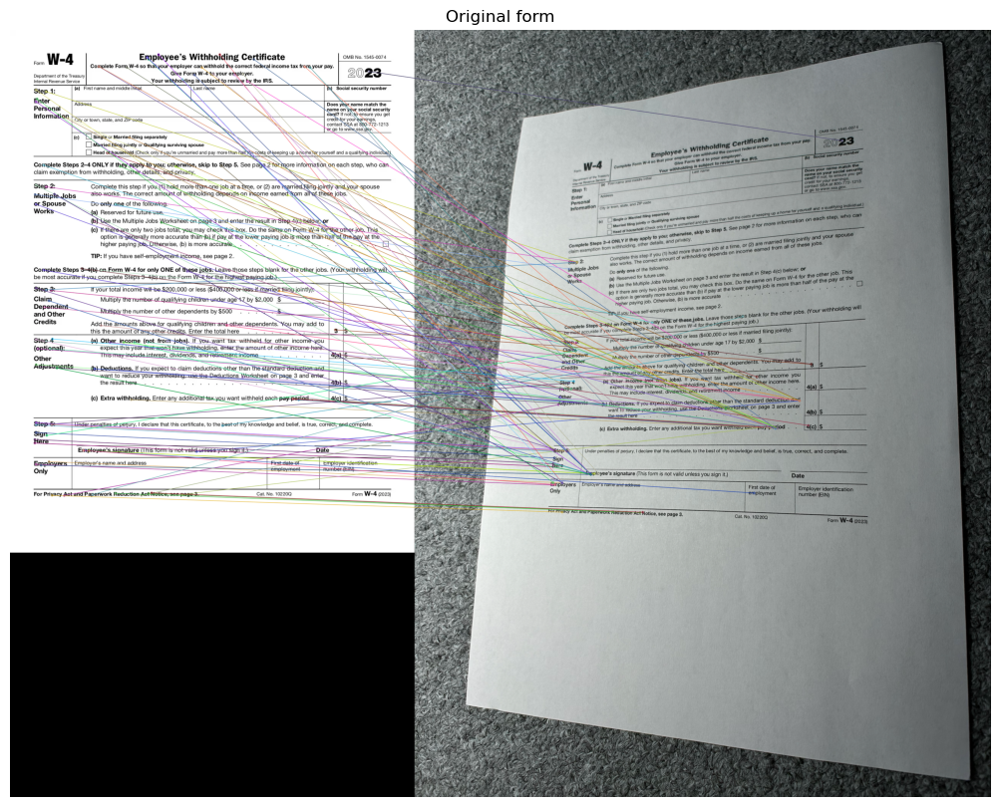

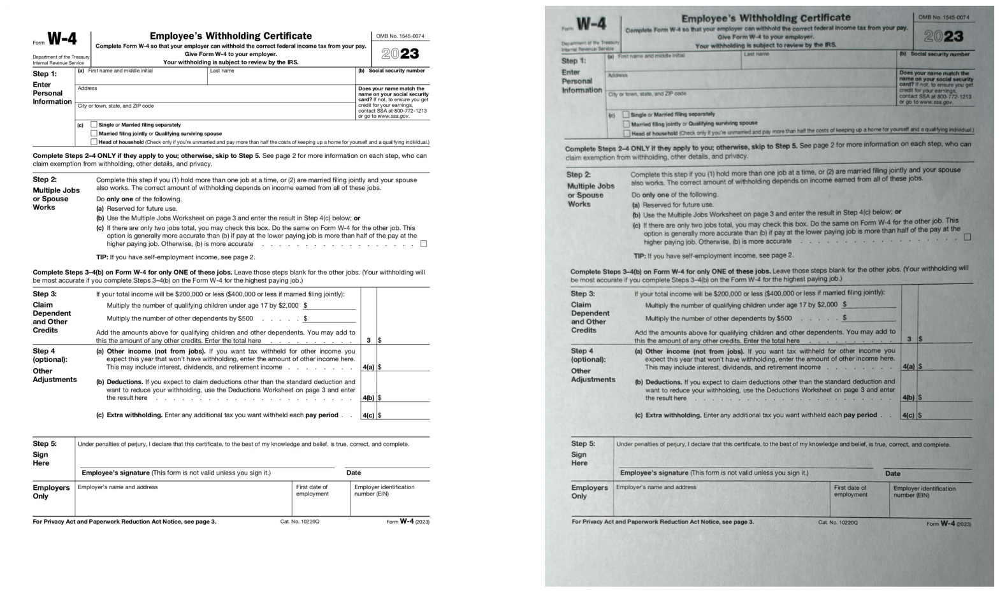

In [45]:
# Use SIFT method to find features, define feature number, contrast threshold, edge threshold, and sigma
numFeatures = 1250
contrastThreshold = 0.04 
edgeThreshold = 10.0
sigma = 1.6 

# Create SIFT object with specified parameters
sift = cv.SIFT_create(nfeatures=numFeatures,
                      contrastThreshold=contrastThreshold,
                      edgeThreshold=edgeThreshold,
                      sigma=sigma)

# Detect keypoints and compute descriptors for both images
keypoint1, descriptor1 = sift.detectAndCompute(form, None)
keypoint2, descriptor2 = sift.detectAndCompute(picture, None)

# Draw keypoints
formDraw = cv.drawKeypoints(form, keypoint1, outImage=np.array([]), color=(255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DEFAULT)
pictureDraw = cv.drawKeypoints(picture, keypoint2, outImage=np.array([]), color=(25, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DEFAULT)

# Plot keypoints of both imagess
plt.figure(figsize=[20, 10])
plt.subplot(121); plt.axis('off'); plt.imshow(formDraw)
plt.subplot(122); plt.axis('off'); plt.imshow(pictureDraw)
plt.title('Found corresponding features')
plt.savefig('SIFT-FLANN-FoundFeatures.png')  # Save the plotted images

# Create a FLANN-based matcher
initMatcher = cv.DescriptorMatcher_create(cv.DescriptorMatcher_FLANNBASED)

# Match descriptors between the two images
matchedPoints = initMatcher.match(descriptor1, descriptor2)

# Convert matches to list and sort them by distance
matchedPoints = [match for match in matchedPoints]
matchedPoints.sort(key=lambda x: x.distance, reverse=False)

# Select the top 10% of matches with lowest distances
numGreatMatch = int(len(matchedPoints) * 0.1)
matchedPoints = matchedPoints[:numGreatMatch]

# Draw matches, plot, and save
img_matches = cv.drawMatches(form, keypoint1, picture, keypoint2, matchedPoints, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(40, 10))
plt.imshow(img_matches)
plt.axis('off')
plt.title('Original form')
plt.savefig('SIFT-FLANN-FoundMatches.png') 

# Compute homography between matched keypoints
points1 = np.zeros((len(matchedPoints), 2), dtype=np.float32)
points2 = np.zeros((len(matchedPoints), 2), dtype=np.float32)

# Extract coordinates of matched keypoints
for i, match in enumerate(matchedPoints):
    points1[i, :] = keypoint1[match.queryIdx].pt
    points2[i, :] = keypoint2[match.trainIdx].pt

# Find homography matrix using RANSAC algorithm
h, mask = cv.findHomography(points2, points1, cv.RANSAC)

# Warp the second image to align with the first image
height, width, channels = form.shape
image2Registration = cv.warpPerspective(picture, h, (width, height))

# Plot original, warped, and save the image
plt.figure(figsize=(20, 20))
plt.subplot(121); plt.axis('off'); plt.imshow(form)
plt.subplot(122); plt.axis('off'); plt.imshow(image2Registration)
plt.savefig('SIFT-FLANN-WarpedImages.png') 

# SIFT and Brute Force Matcher

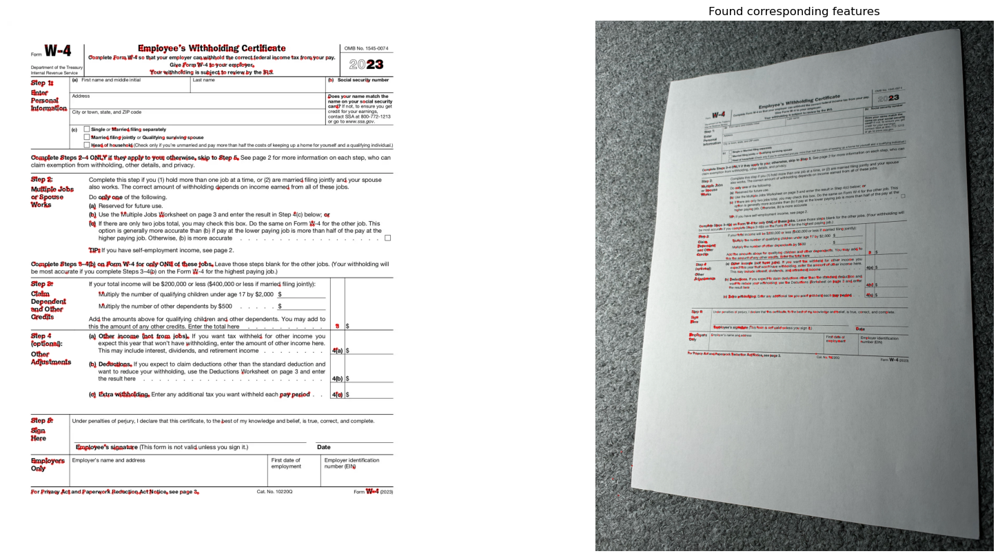

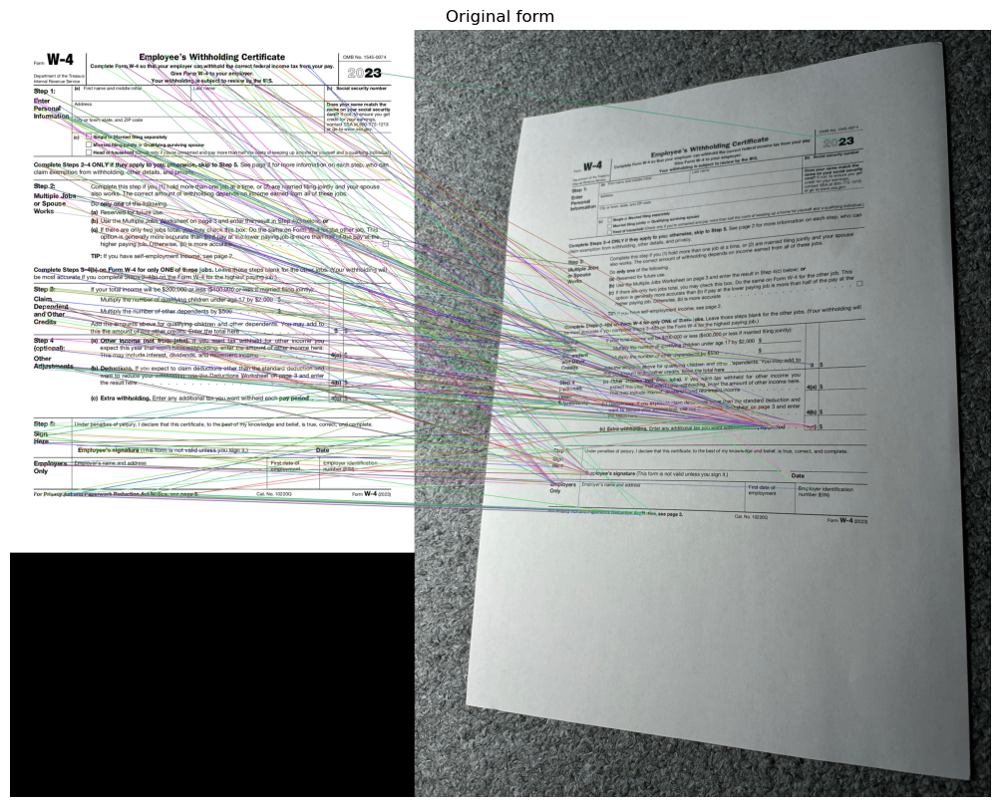

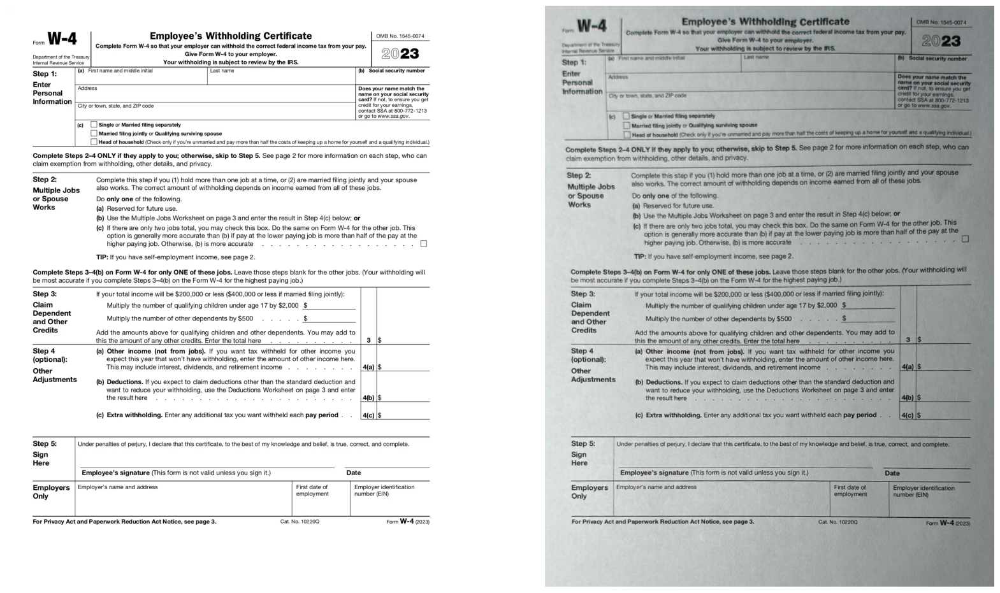

In [46]:
# Use SIFT method to find features, define feature number, contrast threshold, edge threshold, and sigma
numFeatures = 1250 
contrastThreshold = 0.05 
edgeThreshold = 9.0 
sigma = 1.6 

# Create SIFT object with specified parameters
sift = cv.SIFT_create(nfeatures=numFeatures,
                      contrastThreshold=contrastThreshold,
                      edgeThreshold=edgeThreshold,
                      sigma=sigma)
keypoints1, descriptors1 = sift.detectAndCompute(form, None)
keypoints2, descriptors2 = sift.detectAndCompute(picture, None)

# Draw keypoints on both images
formDraw = cv.drawKeypoints(form, keypoints1, outImage=np.array([]), color=(255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DEFAULT)
pictureDraw = cv.drawKeypoints(picture, keypoints2, outImage=np.array([]), color=(255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DEFAULT)

# Plot both images with keypoints
plt.figure(figsize=[20, 10])
plt.subplot(121); plt.axis('off'); plt.imshow(formDraw)
plt.subplot(122); plt.axis('off'); plt.imshow(pictureDraw)
plt.title('Found corresponding features')
plt.savefig('SIFT-KNN-FoundFeatures.png')

# KNN matcher
bf = cv.BFMatcher()
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply ratio test to select good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Draw good matches between the images
img_matches = cv.drawMatches(form, keypoints1, picture, keypoints2, good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(40, 10))
plt.imshow(img_matches)
plt.axis('off')
plt.title('Original form')
plt.savefig('SIFT-KNN-FoundMatches.png')

# Compute homography based on good matches
points1 = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
points2 = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

h, _ = cv.findHomography(points2, points1, cv.RANSAC)

# Warp the second image to align with the first image
height, width, channels = form.shape
image2Registration = cv.warpPerspective(picture, h, (width, height))

# Plot original and warped images
plt.figure(figsize=(20, 20))
plt.subplot(121); plt.axis('off'); plt.imshow(form)
plt.subplot(122); plt.axis('off'); plt.imshow(image2Registration)
plt.savefig('SIFT-KNN-WarpedImages.png')


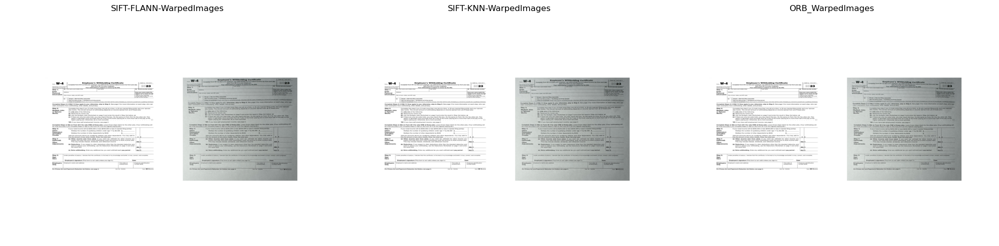

In [47]:
SIFT_FLANN = 'SIFT-FLANN-WarpedImages.png'
SIFT_KNN = 'SIFT-KNN-WarpedImages.png'
ORB_BRUTE = 'ORB_WarpedImages.png'

Matched = [SIFT_FLANN, SIFT_KNN, ORB_BRUTE]

# Create a figure to plot the images
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Plot and save each image
for i, match in enumerate(Matched):
    img = cv.imread(match)
    axes[i].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB), aspect='auto')
    axes[i].set_title(f"{match.split('.')[0]}")
    axes[i].axis('off')

plt.tight_layout()
plt.savefig('Warped_Images.png', dpi=300) 
plt.show()




# Question 1.3 

Feature detection plays an important role in many computer vision tasks. In this
question, we will be exploring and evaluating the different feature detection methods.

## Question 1.3.1 [10 marks] 
An image has been provided. Plot on a 3 x 2 sub-plotted figure,
the 200 strongest features when using the Minimum Eigenvalue, SIFT, KAZE, FAST,
ORB and the Harris-Stpehens algorithms. Include this sub-figure in your report and
ensure that when the python code execute, it appears as a sub-figure.
Your solution should include:
1. Your code for Task 2 and all files needed for the code to run
2. The generated subplot figure (report in PDF)
3. The generated subplot figure (.fig file)

Ref: https://docs.opencv.org/4.x/db/d27/tutorial_py_table_of_contents_feature2d.html

/var/folders/_v/mhl1b0xx123bg1n6gl560mnm0000gn/T/ipykernel_40194/272577320.py:20: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


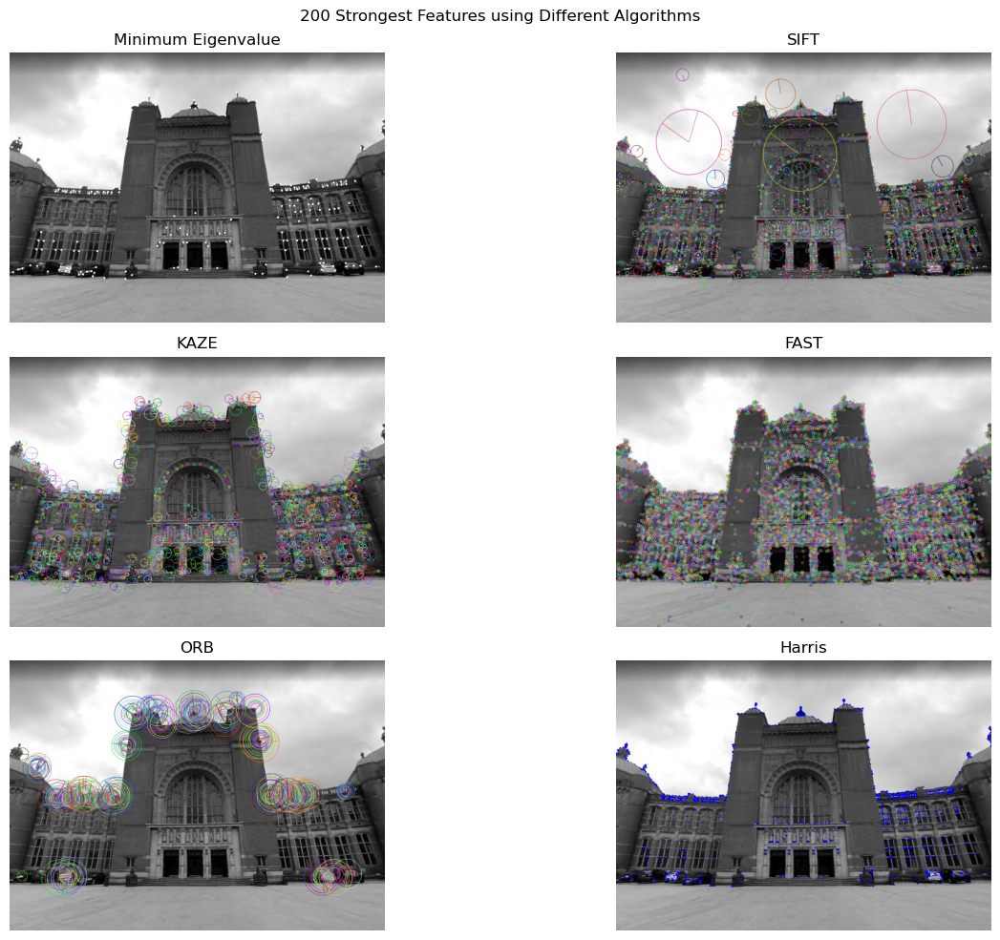

In [50]:
# Load the image
gray_image = cv.imread('./1_3/aston_webb.JPG', cv.IMREAD_GRAYSCALE)

# Initialize feature detectors for each algorithm
feature_detectors = {
    'Minimum Eigenvalue': cv.goodFeaturesToTrack,
    'SIFT': cv.SIFT_create,
    'KAZE': cv.KAZE_create,
    'FAST': cv.FastFeatureDetector_create,
    'ORB': cv.ORB_create,
    'Harris': cv.cornerHarris  # Harris corner detection algorithm from OpenCV
}

# Function to detect and draw features
def detect_and_draw_features(detector_name, img, gray_img):
    output_img = cv.cvtColor(img, cv.COLOR_GRAY2RGB)  # Create a copy of the input image
    
    if detector_name == 'Minimum Eigenvalue':
        corners = feature_detectors[detector_name](gray_img, 200, qualityLevel=0.01, minDistance=10)
        corners = np.int0(corners)
        for corner in corners:
            x, y = corner.ravel()
            cv.circle(output_img, (x, y), 3, (255, 255, 255), -1)  # Draw white circles
            
    elif detector_name == 'Harris':
        # Harris corner detection
        dst = feature_detectors[detector_name](np.float32(gray_img), 2, 3, 0.04)
        dst = cv.dilate(dst, None)
        output_img[dst > 0.01 * dst.max()] = [0, 0, 255]  # Mark corners in red
    
    else:
        # For SIFT, KAZE, FAST, ORB
        detector = feature_detectors[detector_name]()
        keypoints = detector.detect(gray_img, None)
        output_img = cv.drawKeypoints(output_img, keypoints, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    return output_img

# Create a 3x2 subplot figure
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 10))
fig.suptitle('200 Strongest Features using Different Algorithms')

# Plot the features for each algorithm
for ax, (detector_name, _) in zip(axes.flat, feature_detectors.items()):
    ax.set_title(detector_name)
    feature_img = detect_and_draw_features(detector_name, np.copy(gray_image), gray_image)
    ax.imshow(feature_img, cmap='gray' if detector_name == 'Minimum Eigenvalue' else 'viridis')
    ax.axis('off')

# Show the subplot figure
plt.tight_layout()
plt.savefig('feature_detection_results.png')
plt.show()

## Question 1.3.2 [10 marks] 
Describe briefly 3 of the 6 feature detection methods previously
explored. Give a brief overview of each of these methods and how they differ from each
other. Discuss how these differences are represented in the results from Question 1.3.1.
Include the answer to this section in your report.